In [1]:
import pandas as pd
import numpy as np
from scipy import stats

# to visualize the data
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.model_selection import train_test_split, cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
# ignore warnings   
import warnings
warnings.filterwarnings('ignore')



In [10]:
data = pd.read_csv('/Users/fizx/Downloads/Telco_row_data.csv')
# print all column
pd.set_option('display.max_columns', None)
# print first 3 rows
df = data.copy()
df.head(3)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [12]:
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')

In [13]:
df['TotalCharges'] = df['TotalCharges'].fillna(0)

In [14]:
df['TotalCharges'].isnull().sum()

np.int64(0)

In [15]:
df['churns'] = df['Churn']

In [16]:
df['churns'] = df['churns'].map({'Yes': 1, 'No': 0})

In [17]:
df['churns']

0       0
1       0
2       1
3       0
4       1
       ..
7038    0
7039    0
7040    0
7041    1
7042    0
Name: churns, Length: 7043, dtype: int64

In [18]:
df.groupby(['SeniorCitizen'])['churns'].agg('mean')

SeniorCitizen
0    0.236062
1    0.416813
Name: churns, dtype: float64

In [19]:
df.groupby(['churns'])['TotalCharges'].agg('mean')

churns
0    2549.911442
1    1531.796094
Name: TotalCharges, dtype: float64

In [20]:
(df['TotalCharges'].mean()).round(2)

np.float64(2279.73)

In [21]:
df.select_dtypes(include=['number']).corr()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,churns
SeniorCitizen,1.000000,0.016567,0.220173,0.103006,0.150889
tenure,0.016567,1.000000,0.247900,0.826178,-0.352229
MonthlyCharges,0.220173,0.247900,1.000000,0.651174,0.193356
TotalCharges,0.103006,0.826178,0.651174,1.000000,-0.198324
churns,0.150889,-0.352229,0.193356,-0.198324,1.000000


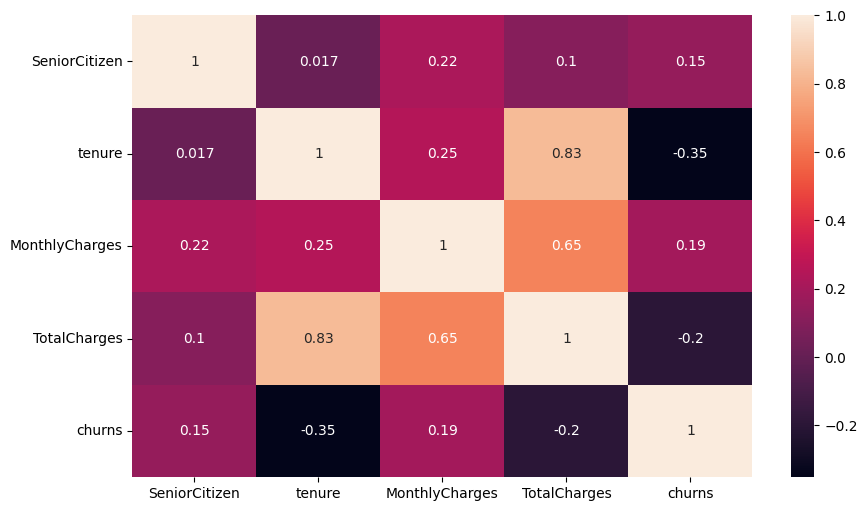

In [22]:
plt.figure(figsize=(10,6))
sns.heatmap(df.select_dtypes(include='number').corr(), annot=True)
plt.show()

In [23]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    table = pd.crosstab(x, y)
    chi2 = chi2_contingency(table)[0]
    n = table.sum().sum()
    phi2 = chi2 / n
    r, k = table.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

In [24]:
cat_cols = df.select_dtypes(include='object').columns

cramers_results = pd.DataFrame(index=cat_cols, columns=cat_cols)

for col1 in cat_cols:
    for col2 in cat_cols:
        cramers_results.loc[col1, col2] = cramers_v(df[col1], df[col2])

In [25]:
cramers_results

,customerID,gender,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
customerID,NaN,inf,NaN,inf,NaN,NaN,NaN,inf,NaN,NaN,NaN,inf,inf,NaN,NaN,NaN,NaN
gender,NaN,0.999716,0.0,0.0,0.0,0.0,0.0,0.002416,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Partner,NaN,0.0,0.999716,0.452241,0.012439,0.142918,0.0,0.151083,0.152419,0.165725,0.126533,0.136314,0.128482,0.29558,0.008414,0.16146,0.149663
Dependents,inf,0.0,0.452241,0.999662,0.0,0.018594,0.179491,0.193862,0.161897,0.156677,0.18161,0.146124,0.140337,0.243647,0.110429,0.149335,0.163448
PhoneService,NaN,0.0,0.012439,0.0,0.999188,0.999929,0.452144,0.175477,0.172007,0.171504,0.176185,0.179658,0.176731,0.0,0.010702,0.0,0.0
MultipleLines,NaN,0.0,0.142918,0.018594,0.999929,1.0,0.396424,0.229022,0.244617,0.2458,0.229577,0.261286,0.261852,0.078633,0.165496,0.165672,0.0364
InternetService,NaN,0.0,0.0,0.179491,0.452144,0.396424,1.0,0.724373,0.707084,0.707007,0.722811,0.717003,0.715911,0.206263,0.378079,0.312486,0.322037
OnlineSecurity,inf,0.002416,0.151083,0.193862,0.175477,0.229022,0.724373,1.0,0.718339,0.717195,0.732982,0.707688,0.708108,0.30092,0.341408,0.304303,0.347016
OnlineBackup,NaN,0.0,0.152419,0.161897,0.172007,0.244617,0.707084,0.718339,1.0,0.71903,0.719739,0.714602,0.713584,0.258059,0.320626,0.281802,0.29185
DeviceProtection,NaN,0.0,0.165725,0.156677,0.171504,0.2458,0.707007,0.717195,0.71903,1.0,0.726393,0.733572,0.735959,0.29654,0.321212,0.286319,0.281095


In [26]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
churns              0
dtype: int64

In [27]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,churns
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,0
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No,0
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,0
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1


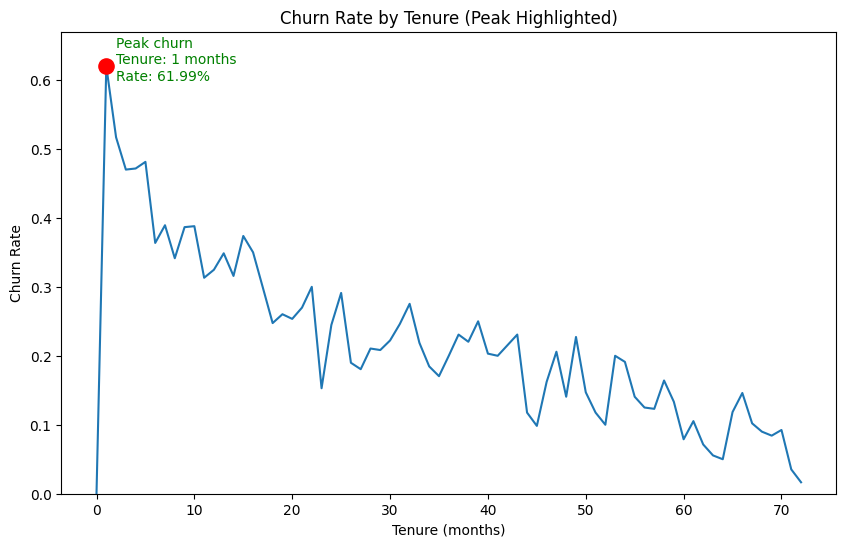

In [28]:
grouped = df.groupby('tenure')['churns'].mean()

peak_x = grouped.idxmax()      # tenure with highest churn
peak_y = grouped.max()         # highest churn rate

plt.figure(figsize=(10,6))

sns.lineplot(x=grouped.index, y=grouped.values)

# highlight the peak point
plt.scatter(peak_x, peak_y, color='red', s=120, zorder=5)

# add annotation slightly ABOVE the point
plt.text(
    peak_x + 1,           # slight right shift
    peak_y - 0.02,          # slight upward shift
    f"Peak churn\nTenure: {peak_x} months\nRate: {peak_y*100:.2f}%",
    color='green',
    fontsize=10,

)

plt.title("Churn Rate by Tenure (Peak Highlighted)")
plt.xlabel("Tenure (months)")
plt.ylabel("Churn Rate")
plt.ylim(0, peak_y + 0.05)     # add space above the peak for the label
plt.show()

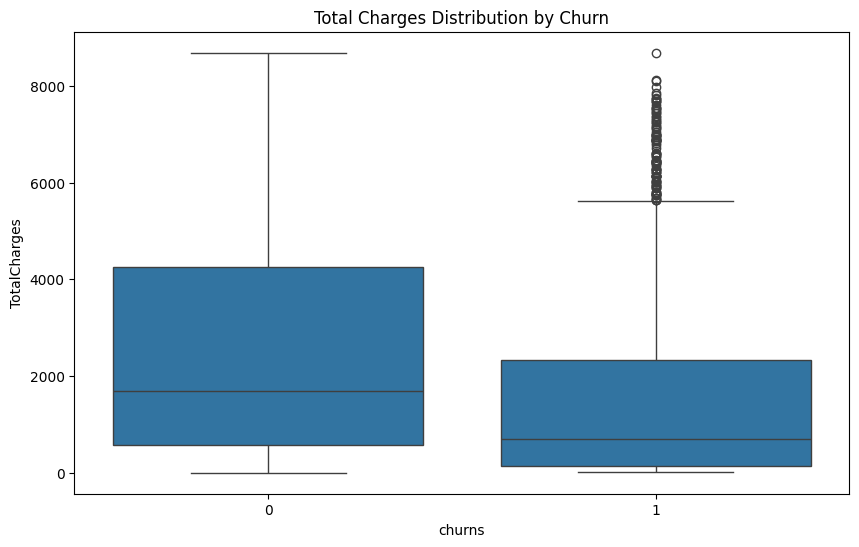

In [29]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='churns', y='TotalCharges')
plt.title('Total Charges Distribution by Churn')
plt.show()

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
ax = sns.boxplot(data=df, x='churns', y='SeniorCitizen')

# Calculate statistics
stats = df.groupby('churns')['TotalCharges'].describe()

for i, churn_value in enumerate(stats.index):
    mean_val = stats.loc[churn_value, 'mean']
    q1_val   = stats.loc[churn_value, '25%']
    median   = stats.loc[churn_value, '50%']
    q3_val   = stats.loc[churn_value, '75%']

    # Annotate on plot
    ax.text(i - 0.25, mean_val,  f"Mean: {mean_val:.0f}", color='blue')
    ax.text(i - 0.25, q1_val,    f"Q1: {q1_val:.0f}", color='yellow')
    ax.text(i - 0.25, median,    f"Median: {median:.0f}", color='purple')
    ax.text(i - 0.25, q3_val,    f"Q3: {q3_val:.0f}", color='red')

plt.title("Total Charges Distribution by Churn (Annotated)")
plt.show()

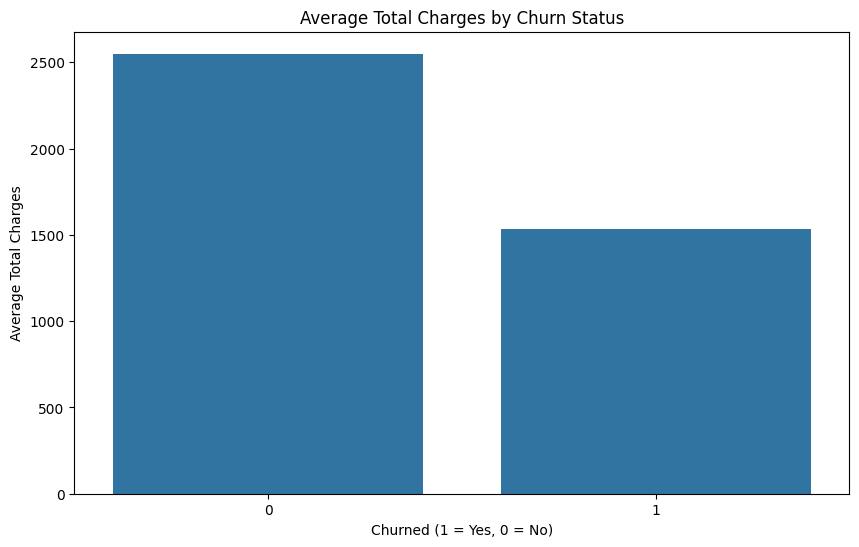

In [31]:
plt.figure(figsize=(10,6))

sns.barplot(data=df, x='churns', y='TotalCharges', estimator='mean', ci=None)

plt.title("Average Total Charges by Churn Status")
plt.xlabel("Churned (1 = Yes, 0 = No)")
plt.ylabel("Average Total Charges")
plt.show()

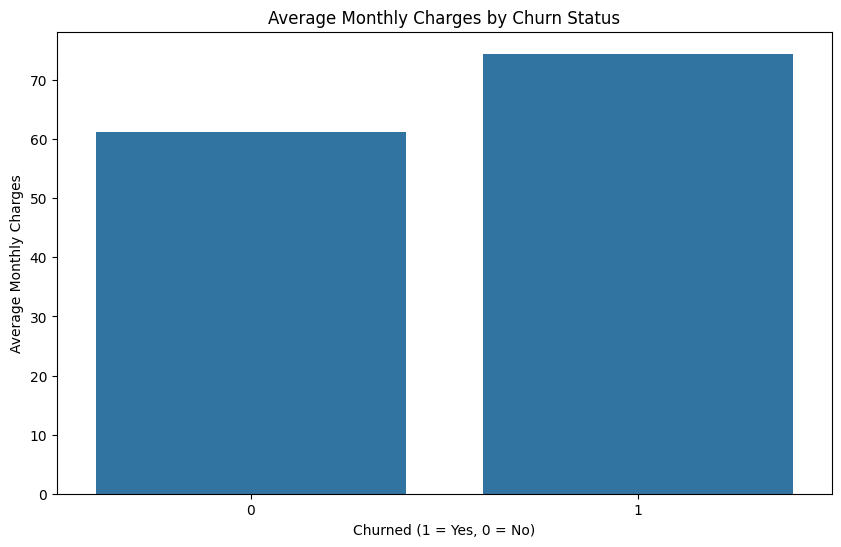

In [113]:
plt.figure(figsize=(10,6))

sns.barplot(data=df, x='churns', y='MonthlyCharges', estimator='mean', ci=None)

plt.title("Average Monthly Charges by Churn Status")
plt.xlabel("Churned (1 = Yes, 0 = No)")
plt.ylabel("Average Monthly Charges")
plt.show()

In [32]:
pd.crosstab(df['PaymentMethod'], df['churns'], normalize='index') * 100

churns,0,1
PaymentMethod,,
Bank transfer (automatic),83.290155,16.709845
Credit card (automatic),84.756899,15.243101
Electronic check,54.714588,45.285412
Mailed check,80.893300,19.106700


In [40]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# Cramér's V function
def cramers_v(x, y):
    table = pd.crosstab(x, y)
    chi2 = chi2_contingency(table)[0]
    n = table.sum().sum()
    phi2 = chi2/n
    r, k = table.shape
    return np.sqrt(phi2 / (min(k-1, r-1)))

print('score = ',cramers_v(df['PaymentMethod'], df['churns']))

score =  0.30335862555407056


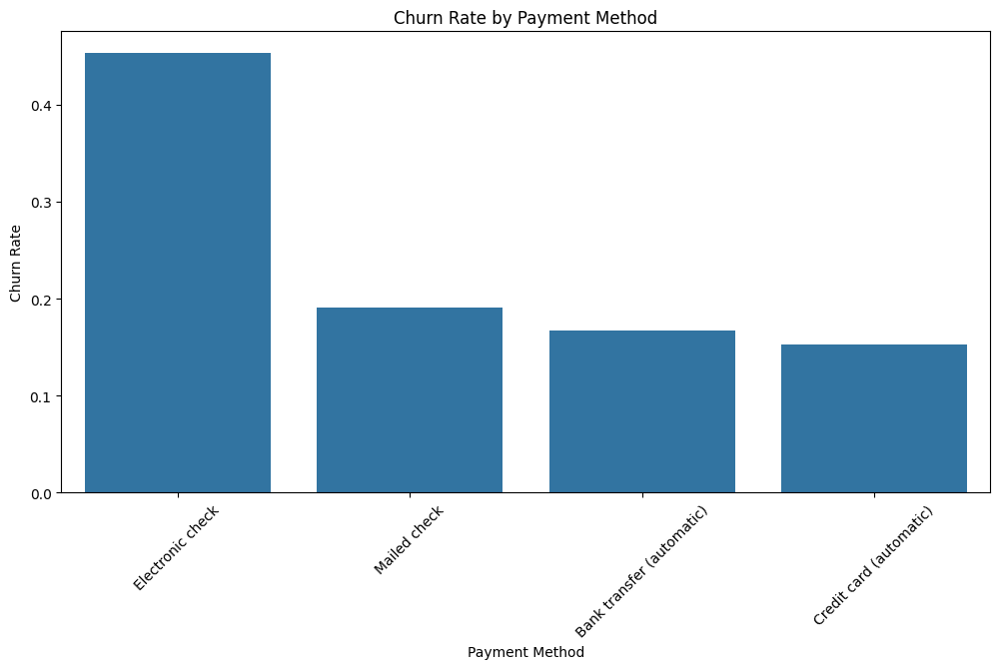

In [129]:

plt.figure(figsize=(12,6))
sns.barplot(
    data=df,
    x='PaymentMethod',
    y='churns',
    estimator='mean',
    ci=None
)

plt.xticks(rotation=45)
plt.title('Churn Rate by Payment Method')
plt.ylabel('Churn Rate')
plt.xlabel('Payment Method')
plt.show()

In [37]:
cat_cols = [
    'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
    'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
    'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod'
]

In [38]:
def cramers_v(x, y):
    table = pd.crosstab(x, y)
    chi2 = chi2_contingency(table)[0]
    n = table.sum().sum()
    phi2 = chi2/n
    r, k = table.shape
    return np.sqrt(phi2 / (min(k-1, r-1)))

In [45]:
for col in cat_cols:
    print("="*60)
    print(f"{col} — Cramér's V Score:")

    score = cramers_v(df[col], df['churns'])
    print(f"Score = {score:.4f}\n")

    # Crosstab (percentages)
    table = pd.crosstab(df[col], df['churns'], normalize='index') * 100
    print(table)
    print("\n")

PhoneService — Cramér's V Score:
Score = 0.0114

churns                0          1
PhoneService                      
No            75.073314  24.926686
Yes           73.290363  26.709637


MultipleLines — Cramér's V Score:
Score = 0.0401

churns                    0          1
MultipleLines                         
No                74.955752  25.044248
No phone service  75.073314  24.926686
Yes               71.390104  28.609896


InternetService — Cramér's V Score:
Score = 0.3225

churns                   0          1
InternetService                      
DSL              81.040892  18.959108
Fiber optic      58.107235  41.892765
No               92.595020   7.404980


OnlineSecurity — Cramér's V Score:
Score = 0.3474

churns                       0          1
OnlineSecurity                           
No                   58.233276  41.766724
No internet service  92.595020   7.404980
Yes                  85.388806  14.611194


OnlineBackup — Cramér's V Score:
Score = 0.2923

churns

In [46]:
scores = {col: cramers_v(df[col], df['churns']) for col in cat_cols}
sorted(scores.items(), key=lambda x: x[1], reverse=True)

[('Contract', np.float64(0.4101156965761409)),
 ('OnlineSecurity', np.float64(0.3474004326740552)),
 ('TechSupport', np.float64(0.3429161982469257)),
 ('InternetService', np.float64(0.32245455521230887)),
 ('PaymentMethod', np.float64(0.30335862555407056)),
 ('OnlineBackup', np.float64(0.2923155121954445)),
 ('DeviceProtection', np.float64(0.281579732968073)),
 ('StreamingMovies', np.float64(0.23095080906926801)),
 ('StreamingTV', np.float64(0.2305023384466809)),
 ('PaperlessBilling', np.float64(0.19149814355338285)),
 ('MultipleLines', np.float64(0.04010925283378871)),
 ('PhoneService', np.float64(0.011398285522718045))]

In [47]:
cols = cat_cols + ['churns']   # include churns in the heatmap
matrix = pd.DataFrame(index=cols, columns=cols)

for c1 in cols:
    for c2 in cols:
        matrix.loc[c1, c2] = cramers_v(df[c1], df[c2])
        
matrix = matrix.astype(float)

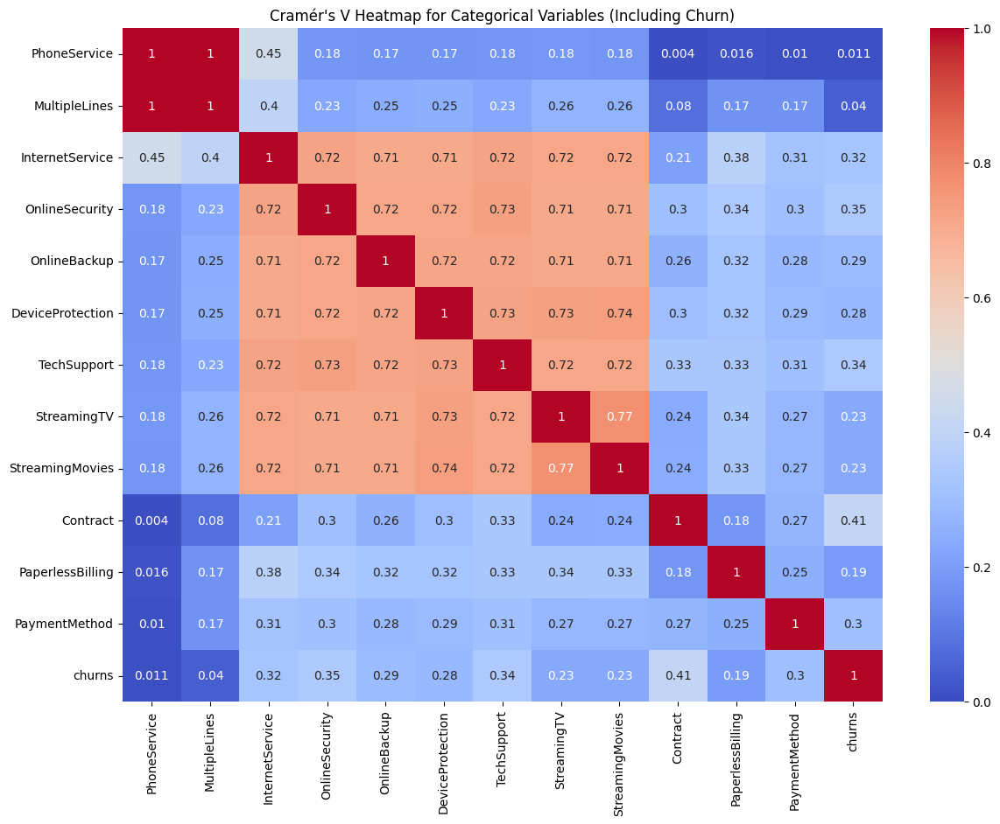

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,10))
sns.heatmap(matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)
plt.title("Cramér's V Heatmap for Categorical Variables (Including Churn)")
plt.show()

In [43]:
for col in cat_cols:
    print("="*60)
    print(f"{col} — Cramér's V Score:")

    score = cramers_v(df[col], df['SeniorCitizen'])
    print(f"Score = {score:.4f}\n")

    # Crosstab (percentages)
    table = pd.crosstab(df[col], df['SeniorCitizen'], normalize='index') * 100
    print(table)
    print("\n")

PhoneService — Cramér's V Score:
Score = 0.0079

SeniorCitizen          0          1
PhoneService                       
No             84.750733  15.249267
Yes            83.681811  16.318189


MultipleLines — Cramér's V Score:
Score = 0.1466

SeniorCitizen             0          1
MultipleLines                         
No                88.997050  11.002950
No phone service  84.750733  15.249267
Yes               77.616964  22.383036


InternetService — Cramér's V Score:
Score = 0.2653

SeniorCitizen            0          1
InternetService                      
DSL              89.301941  10.698059
Fiber optic      73.158915  26.841085
No               96.592398   3.407602


OnlineSecurity — Cramér's V Score:
Score = 0.2111

SeniorCitizen                0          1
OnlineSecurity                           
No                   76.901086  23.098914
No internet service  96.592398   3.407602
Yes                  86.032689  13.967311


OnlineBackup — Cramér's V Score:
Score = 0.1828

Se

# Insights:

1.	Month-to-month customers churn at 43%.
2.  Electronic check customers churn at 45%, the highest of all groups, indicating higher payment instability and lower loyalty.
3.	Fiber optic internet customers churn significantly more (41%) than DSL (19%) or non-internet customers (7%).
4.	Customers without TechSupport churn at 41%, while those with support churn at only 15%.
5.	Lack of Online Security also strongly predicts churn (42% vs 14%).
6.	Customers without OnlineBackup or DeviceProtection churn more, but the effect is moderate.
7.	Phone service and number of lines have almost no relationship with churn.
8.	Paperless billing customers churn more (33%).
9.	Seniors churn at a significantly higher rate (41.7%) compared to non-seniors.